# **Import Libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# **Load Data**

In [2]:
df = pd.read_excel('Dataset_CreditScoring.xlsx')

# **Structure Investigation** <br>
Hal yang perlu diperhatikan:



*   Bentuk umum dari dataset
*   Tipe data di setiap kolom. Apakah ada tipe data yang kurang sesuai?
*   Duplicated data
*   Missing value calculation



## DataFrame General Information

Silakan buat model untuk masalah penilaian kredit dari data yang diberikan. Anda dapat menggunakan apa saja
algoritma yang menurut Anda dapat memecahkan masalah ini. Kami memberi Anda kebebasan untuk menggunakan semua
variabel yang kami sediakan atau hanya menggunakan beberapa di antaranya. Dan yang terakhir, membuat presentasi tentang
model Anda dan wawasan apa yang dapat Anda berikan kepada kami berdasarkan hasil Anda.

- [Definisi Credit Scoring](https://pintek.id/blog/apa-itu-credit-scoring/)
- [Indo](https://iopscience.iop.org/article/10.1088/1742-6596/1998/1/012027/pdf)
- [Luar](https://iopscience.iop.org/article/10.1088/1742-6596/1998/1/012027/pdf)

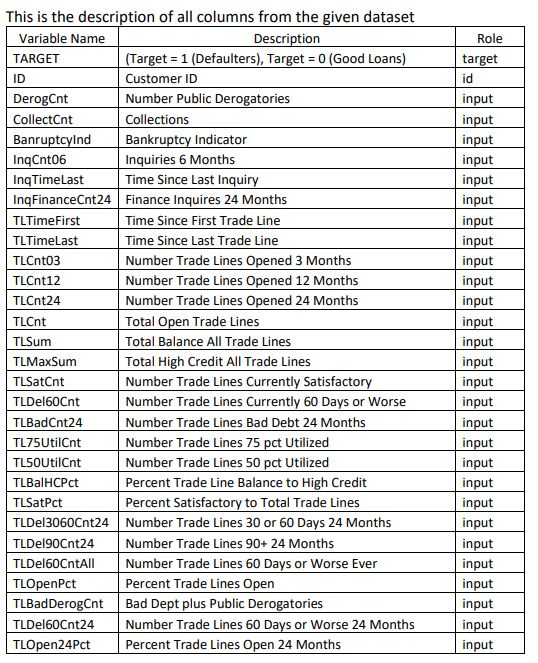

In [3]:
from IPython.display import Image
Image(filename='Capture.jpg')

- Target: Target = 1 (Pelanggaran), Target = 0 (Pinjaman Baik)
- DerogCnt: Jumlah Penghinaan Publik
- CollectCnt: Jumlah penagihan [ref](https://www.paper.id/blog/bisnis/desk-collection-penagihan/)
- BanruptcyInd : Indikator Kebangkrutan (Bangkrut=1, Tidak Bangkrut=0). Idealnya Jika indikator bangkrutnya 1 maka seharusnya tagernya Defaulters.
- InqCnt06 : Pertanyaan 6 Bulan [ref](https://www.myfico.com/credit-education/credit-reports/credit-checks-and-inquiries)
- InqTimeLast: Waktu Sejak Permintaan Terakhir
- TLTimeFirst: Time Since First Trade Line -> Garis perdagangan adalah ringkasan dari setiap kredit bergulir atau angsuran yang Anda miliki. Laporan terperinci ini menguraikan kelayakan kredit Anda dengan mengomunikasikan kepada kreditur dan pemberi pinjaman riwayat pembayaran Anda, riwayat kredit Anda, dan kenakalan Anda. Jalur perdagangan dibuat untuk setiap jalur kredit yang Anda miliki. Contoh jalur perdagangan adalah riwayat pembayaran mobil Anda. Saat Anda mulai membayar kembali pinjaman mobil, jalur perdagangan dibuat yang merangkum informasi kontak Anda, status pembayaran Anda saat ini, tanggal jalur kredit dibuka, dan tanggal penutupan jalur.
- TLTimeLast : Time Since Last Trade Line
- 

In [4]:
df.shape # (jumlah baris, jumlah kolom)

(3000, 30)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 30 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   TARGET           3000 non-null   float64
 1   ID               3000 non-null   int64  
 2   DerogCnt         3000 non-null   float64
 3   CollectCnt       3000 non-null   float64
 4   BanruptcyInd     3000 non-null   float64
 5   InqCnt06         3000 non-null   float64
 6   InqTimeLast      2812 non-null   float64
 7   InqFinanceCnt24  3000 non-null   float64
 8   TLTimeFirst      3000 non-null   float64
 9   TLTimeLast       3000 non-null   float64
 10  TLCnt03          3000 non-null   float64
 11  TLCnt12          3000 non-null   float64
 12  TLCnt24          3000 non-null   float64
 13  TLCnt            2997 non-null   float64
 14  TLSum            2960 non-null   float64
 15  TLMaxSum         2960 non-null   float64
 16  TLSatCnt         2996 non-null   float64
 17  TLDel60Cnt    

- Dataset terdiri dari 3000 baris dan 30 kolom.
- Terdapat beberapa kolom yang missing value (Non-null count < Jumlah baris).
- Semua kolom merupakan numerik.
- Sepertinya tidak ada kolom dengan tipe data yang aneh.



## Data Types <br>
[Pandas select_dtypes](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.select_dtypes.html) <br>
Untuk memudahkan dalam pengecekan entri, kita dapat mencuplik data secara random mengggunakan df.sample(). Hal ini bertujuan untuk mengecek isi dari setiap kolom. Ini akan membangun intuisi kita terhadap data yang kita analisis. Di sini kita memastikan kembali apakah tipe data dari setiap kolom sudah sesuai atau belum. Selain itu, mungkin saja kita juga menemukan entri yang aneh pada kolom tertentu.

In [6]:
# coba running berulang kali
df.sample(5)

,TARGET,ID,DerogCnt,CollectCnt,BanruptcyInd,InqCnt06,InqTimeLast,InqFinanceCnt24,TLTimeFirst,TLTimeLast,...,TL50UtilCnt,TLBalHCPct,TLSatPct,TLDel3060Cnt24,TLDel90Cnt24,TLDel60CntAll,TLOpenPct,TLBadDerogCnt,TLDel60Cnt24,TLOpen24Pct
2116,0.0,81887,1.0,0.0,1.0,1.0,6.0,2.0,328.0,6.0,...,3.0,0.7382,0.3684,0.0,0.0,7.0,0.2105,0.0,0.0,0.500
988,0.0,23126,0.0,0.0,0.0,3.0,0.0,4.0,403.0,10.0,...,1.0,0.9788,0.5000,0.0,0.0,4.0,0.2000,0.0,0.0,1.000
1960,0.0,74354,0.0,0.0,0.0,0.0,NaN,0.0,99.0,7.0,...,2.0,0.6054,0.6667,0.0,0.0,1.0,0.6667,0.0,0.0,0.500
609,0.0,5495,1.0,0.0,0.0,0.0,NaN,0.0,251.0,5.0,...,4.0,0.6844,0.5333,0.0,3.0,7.0,0.4000,3.0,3.0,0.500
456,1.0,114599,0.0,0.0,0.0,5.0,1.0,7.0,371.0,14.0,...,23.0,0.5146,0.7368,3.0,1.0,2.0,0.7632,1.0,1.0,0.069


Sepertinya tidak ada anomali dari setiap entri pada masing-masing kolom.

### Numerical Features <br>

In [7]:
nums = df.select_dtypes(include=['number'])
nums.sample(5)

,TARGET,ID,DerogCnt,CollectCnt,BanruptcyInd,InqCnt06,InqTimeLast,InqFinanceCnt24,TLTimeFirst,TLTimeLast,...,TL50UtilCnt,TLBalHCPct,TLSatPct,TLDel3060Cnt24,TLDel90Cnt24,TLDel60CntAll,TLOpenPct,TLBadDerogCnt,TLDel60Cnt24,TLOpen24Pct
2838,0.0,118847,0.0,0.0,0.0,5.0,1.0,2.0,261.0,4.0,...,1.0,0.1847,0.6842,0.0,0.0,0.0,0.5789,0.0,0.0,0.5455
804,0.0,14129,0.0,0.0,0.0,1.0,1.0,5.0,136.0,18.0,...,3.0,0.6889,0.2500,1.0,0.0,0.0,0.3750,0.0,0.0,1.0000
2467,0.0,100140,0.0,0.0,0.0,1.0,1.0,2.0,268.0,10.0,...,1.0,0.2355,0.5833,0.0,0.0,1.0,0.4167,0.0,0.0,0.4000
1184,0.0,33138,8.0,6.0,1.0,0.0,10.0,1.0,41.0,8.0,...,1.0,0.1965,0.3333,2.0,0.0,1.0,0.6667,2.0,1.0,0.5000
715,0.0,10328,4.0,4.0,0.0,0.0,NaN,0.0,82.0,12.0,...,1.0,0.7701,0.4286,2.0,0.0,3.0,0.1429,0.0,1.0,3.0000


- Terdapat 30 numerical features.
- Tidak ada categorical features.

## Checking Duplicated Data <br>
Cek data duplikat di keseluruhan DataFrame (termasuk Customer ID sebagai identifier).

In [8]:
df.duplicated().any()

False

Tidak ditemukan adanya data duplikat dari pengecekan seluruh kolom pada DataFrame.

## Missing Value Calculation
Sangat lumrah ketika kita mendapatkan dataset yang memiliki baris kosong di kolom tertentu. Oleh karena itu, kita perlu mengecek jumlah baris yang kosong pada dataset ini. Harapannya kita tidak menemukan baris kosong yang jumlahnya sangat besar. 

In [9]:
# Missing value percentage
missing_count = df.isnull().sum()           # the count of missing value
value_count = df.isnull().count()           # the count of all values

missing_percentage = round(missing_count/value_count * 100, 2)
missing_df = pd.DataFrame({'Missing Value Count':missing_count, 'Missing Value Percentage':missing_percentage})
missing_df.sort_values('Missing Value Percentage', ascending=False)

,Missing Value Count,Missing Value Percentage
InqTimeLast,188,6.27
TL50UtilCnt,99,3.30
TL75UtilCnt,99,3.30
TLBalHCPct,41,1.37
TLMaxSum,40,1.33
TLSum,40,1.33
TLSatPct,4,0.13
TLSatCnt,4,0.13
TLCnt,3,0.10
TLOpenPct,3,0.10


Kita berhasil menghitung persentase baris kosong dari setiap kolom. Terdapat 11 kolom yang mengandung missing value, di mana 10 kolom < 5 % dan 1 kolom > 5 %. Opsi yang dapat dilakukan ada dua: Pertama, kita isi dengan nilai mean/mediannya (tergantung distribusi datanya), Kedua, bisa kita drop untuk kolom dengan persentase missing value < 5 %.

  Untuk melihat persebaran missing value dari setiap kolom, kita dapat menggunakan fungsi matrix dari library ***missingno*** yang berfungsi untuk menampilkan plot dari posisi missing value di setiap kolom. Baris kosong ditandai oleh warna putih, sedangkan kolom yang mengandung value berwarna abu-abu.

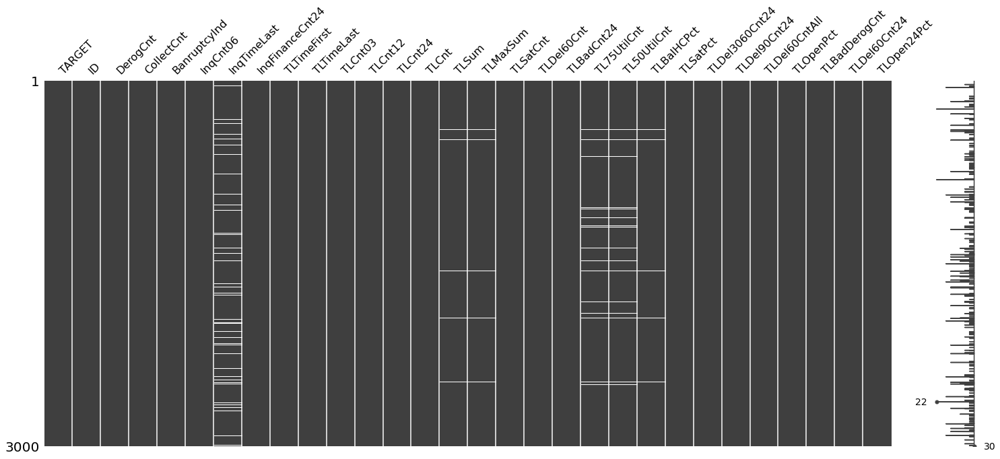

In [10]:
# Plot of Missing Values
import missingno as msno
msno.matrix(df);

Kita juga dapat melihat korelasi dari missing value di satu kolom dengan kolom lainnya menggunakan [heatmap di **missingno**](https://towardsdatascience.com/using-the-missingno-python-library-to-identify-and-visualise-missing-data-prior-to-machine-learning-34c8c5b5f009#:~:text=Using%20missingno%20to%20Identify%20Missing,advantages%20for%20identifying%20missing%20data/). <br>
Deskripsi heatmap:
- Nilai yang mendekati positif 1 menunjukkan bahwa keberadaan missing value di satu kolom berkorelasi dengan keberadaan missing value di kolom lainnya. Dengan kata lain, misal kolom A memiliki missing value pada baris 1, maka pada baris 1 di kolom B juga memiliki missing value.

- Nilai yang mendekati negatif 1 menunjukkan bahwa keberadaan missing value di satu kolom antikorelasi dengan keberadaan missing value di kolom lain. Dengan kata lain, ketika missing value ada di baris 1 kolom A, maka di baris 1 kolom B justru mengandung value.

- Nilai yang mendekati 0, menunjukkan ada sedikit atau tidak ada hubungan antara keberadaan missing value dalam satu kolom dengan kolom lainnya.

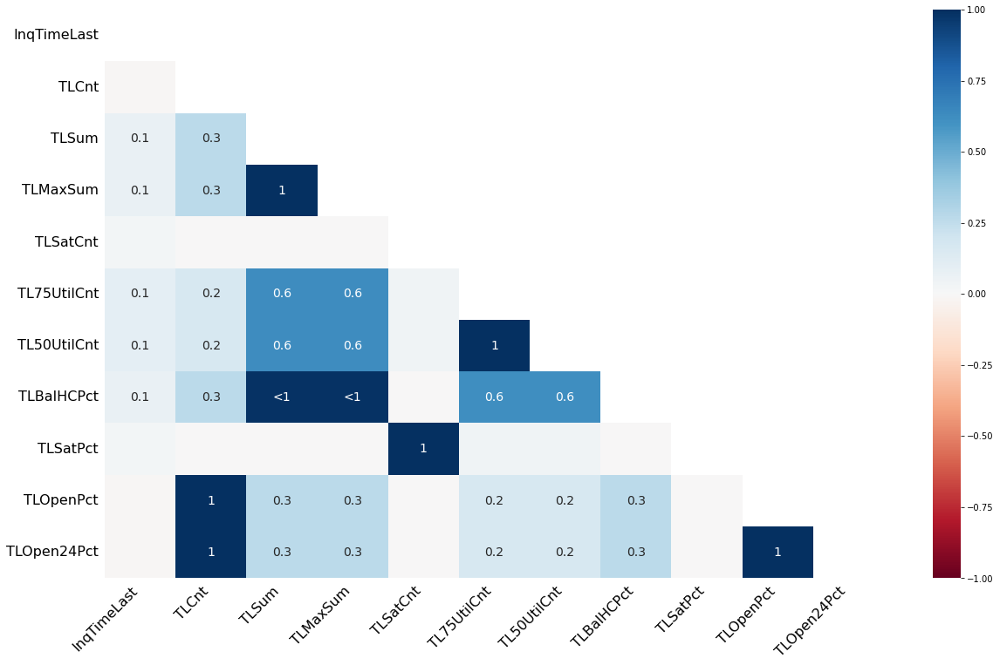

In [11]:
msno.heatmap(df);

Kita dapat melihat bahwa terdapat kolom-kolom yang memiliki korelasi sangat kuat (corr=1) untuk kolom-kolom yang mengandung missing value berdasarkan heatmap di atas.
- TLCnt memiliki nilai korelasi 1 dengan TLOpenPct dan TLOpen24Pct, artinya semua baris yang missing value pada kolom TLCnt adalah baris yang juga missing value pada kolom TLOpen24Pct dan TLOpenPct.
- Begitu juga dengan kolom TLBaIHCPCt dengan kolom TLSum, TLMaxSum

# **Descriptive Statistics**

## Describe

Hal-hal yang perlu diperhatikan:
- Apakah nilai yang tertera pada setiap kolom masuk akal?
- Apakah terdapat keanehan dengan nilai maksimal dan nilai minimal di setiap kolom/feature?
- Bagaimana kira-kira distribusi data berdasarkan analisis singkat dari nilai mean dan median?


In [12]:
nums.describe().T

,count,mean,std,min,25%,50%,75%,max
TARGET,3000.0,0.166667,0.372740,0.0,0.0000,0.00000,0.00000,1.0000
ID,3000.0,62922.683667,37203.691912,66.0,30376.5000,62872.50000,96156.50000,126503.0000
DerogCnt,3000.0,1.430000,2.731469,0.0,0.0000,0.00000,2.00000,51.0000
CollectCnt,3000.0,0.857000,2.161352,0.0,0.0000,0.00000,1.00000,50.0000
BanruptcyInd,3000.0,0.153333,0.360369,0.0,0.0000,0.00000,0.00000,1.0000
InqCnt06,3000.0,3.108333,3.479171,0.0,1.0000,2.00000,4.00000,40.0000
InqTimeLast,2812.0,3.108108,4.637831,0.0,1.0000,1.00000,3.00000,24.0000
InqFinanceCnt24,3000.0,3.555000,4.477536,0.0,1.0000,2.00000,5.00000,48.0000
TLTimeFirst,3000.0,170.113667,92.813700,6.0,106.0000,151.00000,227.00000,933.0000
TLTimeLast,3000.0,11.873667,16.321412,0.0,4.0000,7.00000,13.00000,342.0000


## Unique Value

In [13]:
for col in df.columns:
    print(col)
    print(df[col].unique(), '- Total Unique Values:', df[col].nunique())
    print('='*40)

TARGET
[1. 0.] - Total Unique Values: 2
ID
[   582    662    805 ... 126465 126487 126503] - Total Unique Values: 3000
DerogCnt
[ 3. 15.  0.  8.  1.  2.  6.  4.  5. 12.  7.  9. 20. 11. 10. 18. 14. 19.
 29. 13. 51. 16. 24. 21. 17. 23.] - Total Unique Values: 26
CollectCnt
[ 3.  9.  0.  5.  1.  2.  7.  4.  8. 11.  6. 18. 17. 12. 26. 13. 50. 14.
 20. 10. 15. 22. 16. 19.] - Total Unique Values: 24
BanruptcyInd
[0. 1.] - Total Unique Values: 2
InqCnt06
[ 4.  3.  1.  6.  9.  2.  5.  0.  8. 13. 10.  7. 16. 11. 18. 22. 29. 27.
 15. 14. 12. 21. 17. 24. 31. 25. 19. 35. 20. 40.] - Total Unique Values: 30
InqTimeLast
[ 0.  1.  5.  2.  3. 15. 23.  6.  8. 11. 17. nan  4. 12.  9.  7. 20. 10.
 16. 21. 24. 19. 18. 14. 13. 22.] - Total Unique Values: 25
InqFinanceCnt24
[ 5.  3.  1. 10.  8.  0.  6.  2.  9.  4. 27. 11.  7. 13. 21. 15. 30. 18.
 14. 12. 26. 22. 29. 19. 20. 31. 17. 23. 24. 16. 25. 34. 39. 42. 33. 40.
 48.] - Total Unique Values: 37
TLTimeFirst
[117.  14. 354.  16. 130. 124. 148. 286. 175. 17

# **Univariate Analysis**

## Scatter Plot
Penggunaan dari scatter plot adalah untuk mengetahui persebaran data secara global, terutama feature yang datanya berupa ordinal/diskret (unique value ~3 sampai 10).

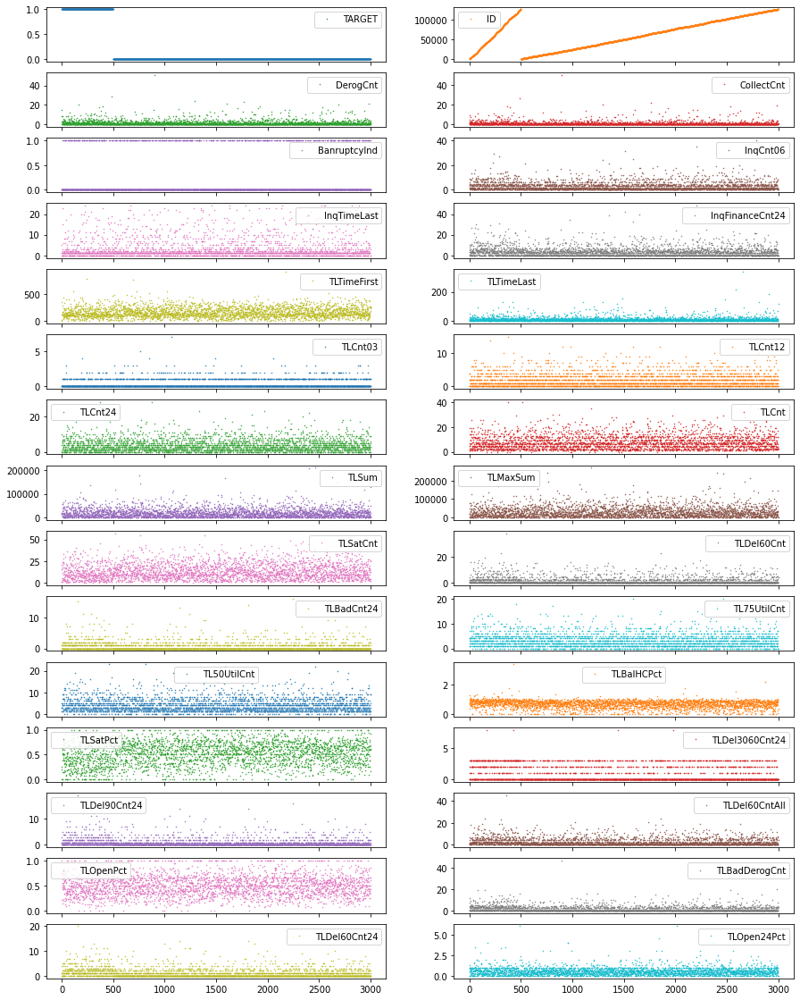

In [14]:
nums.plot(lw=0, marker=".", subplots=True, layout=(-1, 2), figsize=(15, 20), markersize=1);

## Boxplot
Hal yang perlu diperhatikan dari boxplot adalah keberadaan pencilan (outlier) dari setiap feature. Outlier ini berpengaruh terhadap distribusi data sehingga perlu untuk ditangani.

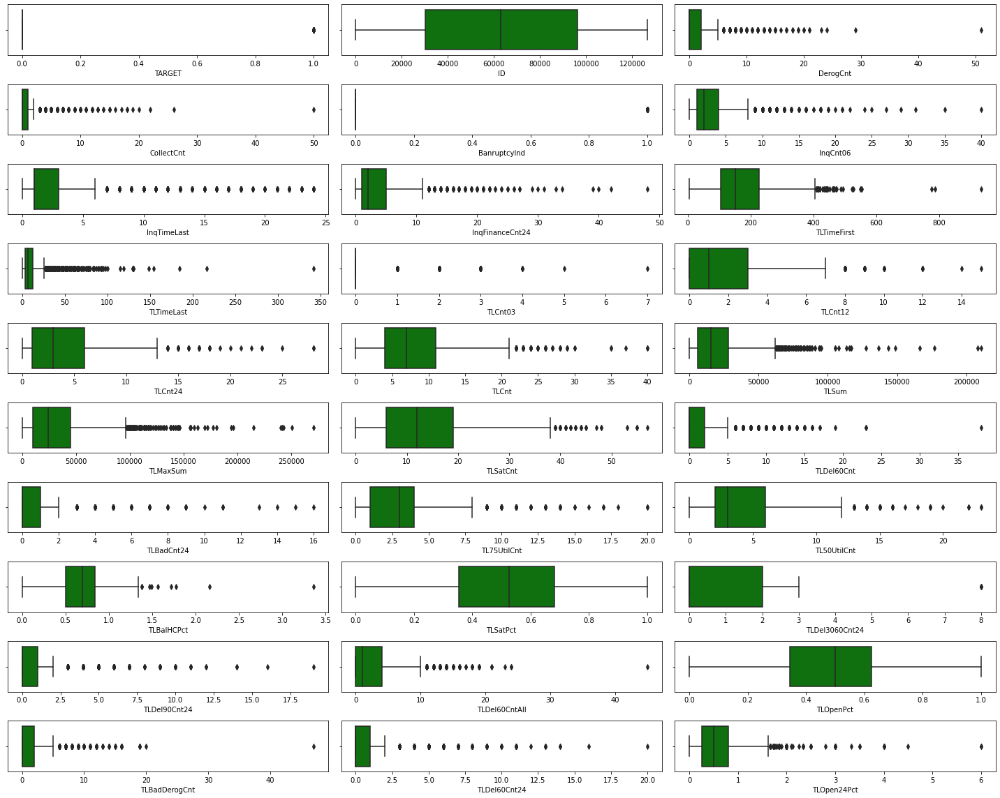

In [15]:
features = nums.columns

plt.figure(figsize=(20, 16))
for i in range(len(features)):
    plt.subplot(10, 3, i+1)
    sns.boxplot(x=nums[features[i]], color='green')
    plt.subplots_adjust(hspace=0.5)
    plt.tight_layout()

## Histogram and KDE plot

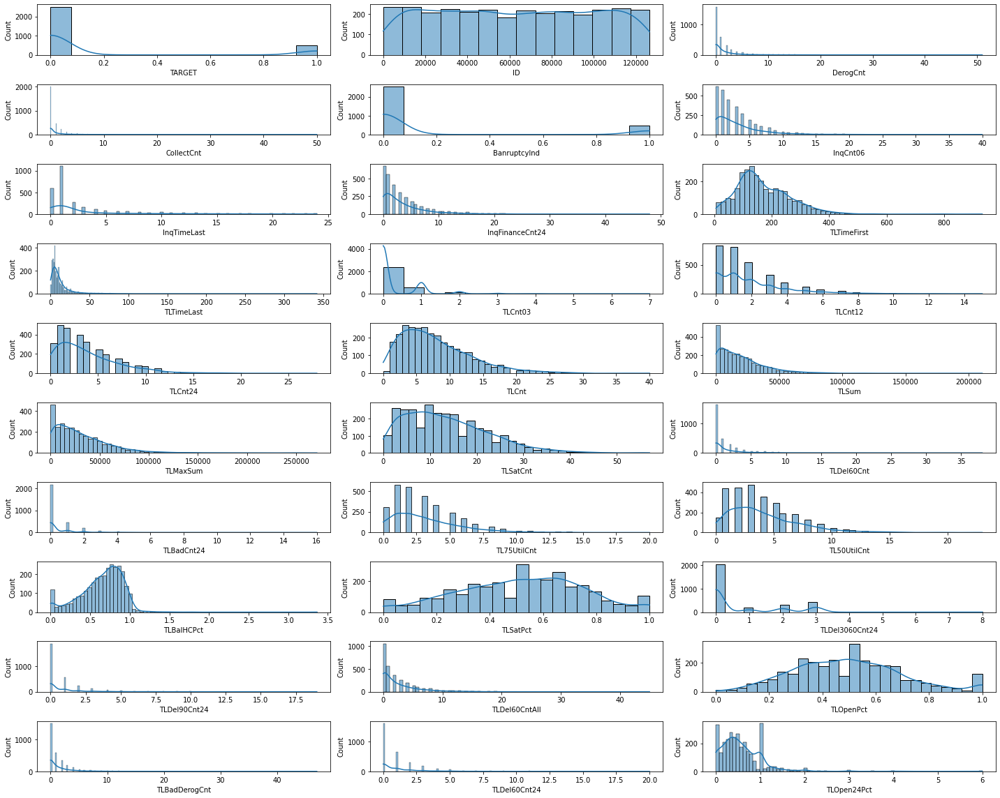

In [16]:
features = nums.columns

plt.figure(figsize=(20, 16))
for i in range(len(features)):
    plt.subplot(10, 3, i+1)
    sns.histplot(data=nums, x=nums[features[i]], kde=True)
    plt.tight_layout()

In [17]:
df.columns

Index(['TARGET', 'ID', 'DerogCnt', 'CollectCnt', 'BanruptcyInd', 'InqCnt06',
       'InqTimeLast', 'InqFinanceCnt24', 'TLTimeFirst', 'TLTimeLast',
       'TLCnt03', 'TLCnt12', 'TLCnt24', 'TLCnt', 'TLSum', 'TLMaxSum',
       'TLSatCnt', 'TLDel60Cnt', 'TLBadCnt24', 'TL75UtilCnt', 'TL50UtilCnt',
       'TLBalHCPct', 'TLSatPct', 'TLDel3060Cnt24', 'TLDel90Cnt24',
       'TLDel60CntAll', 'TLOpenPct', 'TLBadDerogCnt', 'TLDel60Cnt24',
       'TLOpen24Pct'],
      dtype='object')

- Beberapa kolom yang perlu dilakukan transformasi karena right skewed dan mengandung outlier adalah 'DerogCnt', 'CollectCnt', 'InqCnt06', 'InqTimeLast', 'InqFinanceCnt24', 'TLTimeFirst', 'TLTimeLast', 'TLCnt12', 'TLCnt24', 'TLCnt', 'TLSum', 'TLMaxSum', 'TLSatCnt', 'TLDel60Cnt', 'TLBadCnt24', 'TL75UtilCnt', 'TL50UtilCnt', 'TLBalHCPct', 'TLDel90Cnt24', 'TLDel60CntAll', 'TLBadDerogCnt', 'TLDel60Cnt24', 'TLOpen24Pct'.
- Ordinal features: 'TLCnt03', 'TLDel3060Cnt24'
- Normal distribution: 'TLSatPct' dan 'TLOpenPct'
- **TERLIHAT BAHWA TARGET KITA IMBALANCE SEHINGGA PERLU DILAKUKAN SMOTE**

# **Multivariate Analysis**

## Correlation Heatmap <br>

Fungsi dari heatmap correlation adalah untuk menjaring feature-feature yang potensial terhadap target (kolom Churn). Kita mengharapkan nilai absolut korelasi yang tinggi antara feature dan target. Akan tetapi, hal yang perlu diingat bahwa metode yang digunakan adalah Pearson yang pada dasarnya menghitung korelasi linear antar 2 variabel, sehingga kita tidak mengakomodir korelasi yang non-linier.

Selain itu, kita juga ingin mengidentifikasi 2 feature yang berkorelasi kuat (abs(>0.7)). Apabila terdapat 2 feature yang korelasinya kuat maka kemungkinan keduanya redundan dan akan menghasilkan [**Multicollinearity**](https://www.investopedia.com/terms/m/multicollinearity.asp#:~:text=Multicollinearity%20is%20a%20statistical%20concept,in%20less%20reliable%20statistical%20inferences)

In [18]:
nums.corr()

,TARGET,ID,DerogCnt,CollectCnt,BanruptcyInd,InqCnt06,InqTimeLast,InqFinanceCnt24,TLTimeFirst,TLTimeLast,...,TL50UtilCnt,TLBalHCPct,TLSatPct,TLDel3060Cnt24,TLDel90Cnt24,TLDel60CntAll,TLOpenPct,TLBadDerogCnt,TLDel60Cnt24,TLOpen24Pct
TARGET,1.000000,-0.003318,0.088100,0.093748,0.025651,0.106663,-0.033791,0.132562,-0.069597,0.030648,...,0.067608,0.170347,-0.254319,0.233709,0.211577,0.195863,-0.067258,0.208152,0.252026,0.034294
ID,-0.003318,1.000000,-0.000265,0.005866,-0.003411,0.031619,-0.009897,0.002469,0.003226,0.026395,...,0.006689,0.001531,0.020657,-0.000488,0.001148,0.008230,0.019567,-0.000498,-0.002717,0.012194
DerogCnt,0.088100,-0.000265,1.000000,0.880225,0.234483,0.121201,-0.056291,0.121380,-0.128078,0.061630,...,-0.201702,0.033964,-0.229879,-0.004673,0.136909,0.173251,-0.181177,0.646705,0.120908,0.183119
CollectCnt,0.093748,0.005866,0.880225,1.000000,0.046569,0.129457,-0.051427,0.125594,-0.120547,0.042997,...,-0.145832,0.020945,-0.179499,0.009208,0.100022,0.093633,-0.128995,0.656714,0.096379,0.176093
BanruptcyInd,0.025651,-0.003411,0.234483,0.046569,1.000000,0.056958,-0.036385,0.066893,-0.033829,0.043319,...,-0.136977,0.085827,-0.211448,-0.118449,0.181235,0.370924,-0.218103,0.148494,0.134002,0.075997
InqCnt06,0.106663,0.031619,0.121201,0.129457,0.056958,1.000000,-0.425276,0.706689,-0.099267,-0.174511,...,0.138423,0.119634,-0.006449,0.004369,0.073315,0.085576,-0.045827,0.119665,0.071095,0.202724
InqTimeLast,-0.033791,-0.009897,-0.056291,-0.051427,-0.036385,-0.425276,1.000000,-0.286497,0.058960,0.126237,...,-0.062283,-0.055321,0.013718,-0.007015,-0.040745,-0.048662,0.009315,-0.059888,-0.036171,-0.074667
InqFinanceCnt24,0.132562,0.002469,0.121380,0.125594,0.066893,0.706689,-0.286497,1.000000,-0.106121,-0.179374,...,0.142635,0.156230,-0.045687,0.051404,0.094323,0.125956,-0.144359,0.132177,0.102018,0.307929
TLTimeFirst,-0.069597,0.003226,-0.128078,-0.120547,-0.033829,-0.099267,0.058960,-0.106121,1.000000,0.061874,...,0.145578,-0.069199,-0.103543,0.110506,0.082631,0.143017,-0.139792,-0.022439,0.090978,-0.263974
TLTimeLast,0.030648,0.026395,0.061630,0.042997,0.043319,-0.174511,0.126237,-0.179374,0.061874,1.000000,...,-0.226698,-0.143288,-0.167283,0.041929,0.068718,0.060690,-0.063795,0.076889,0.073173,-0.354857


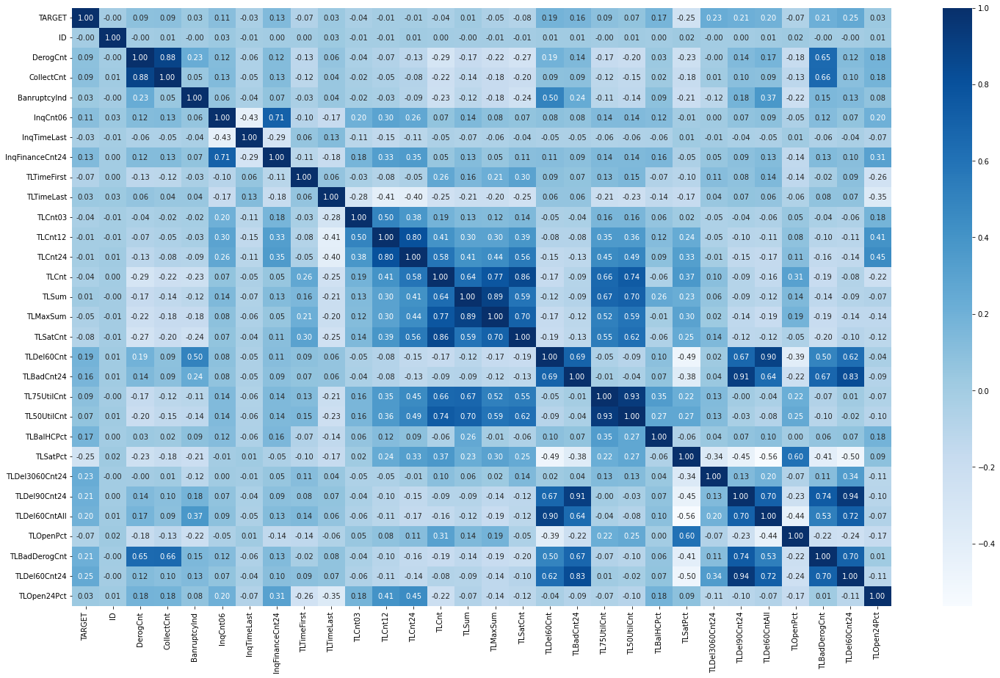

In [19]:
plt.figure(figsize=(25, 15))
sns.heatmap(nums.corr(), annot=True, fmt='.2f', cmap='Blues');

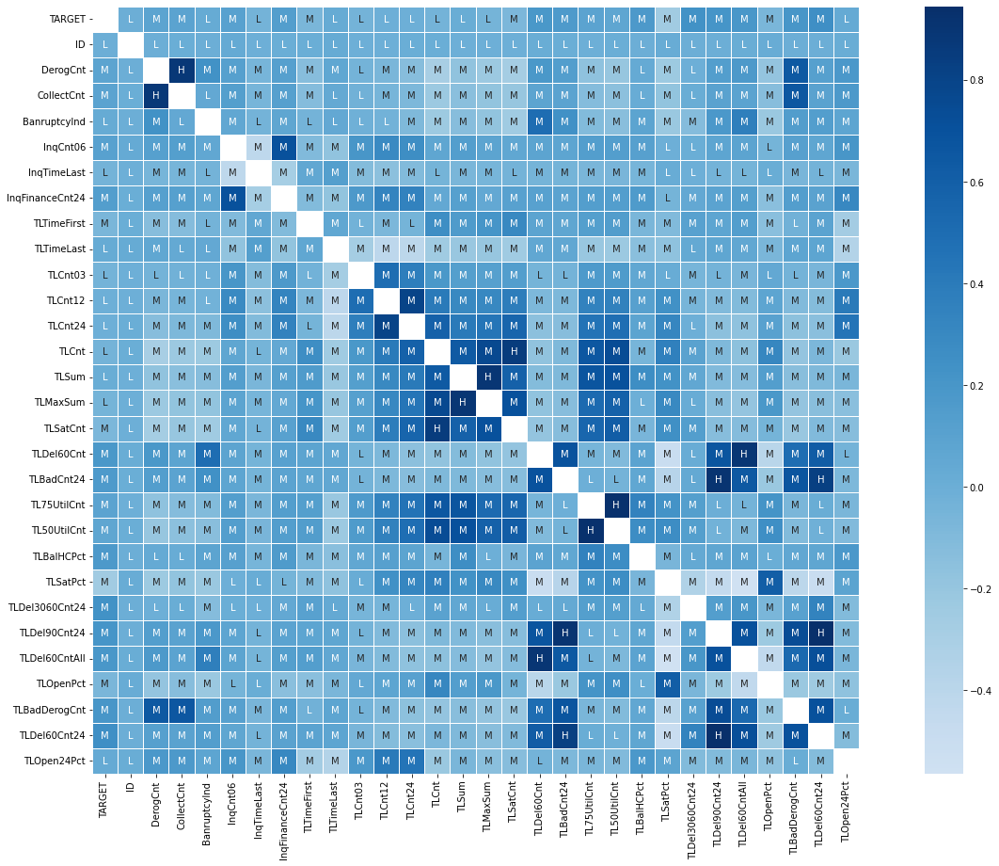

In [20]:
plt.figure(figsize=(25, 15))
corr = nums.corr(method='pearson')

labels = np.where(abs(corr)>0.8, 'H', np.where(abs(corr)>= 0.05, 'M', 'L'))

sns.heatmap(corr, mask=np.eye(len(corr)), square=True, center=0, annot=labels,
            fmt='', lw='.5', cmap='Blues');

Kita buat kategori agar mempermudah pembacaan nilai di atas dengan pembagian sebagai berikut:
- corr > 0.8 : high
- 0.05 <= corr <= 0.8 : medium
- corr < 0.05 : low

Beberapa hal yang teramati dari heatmap di atas adalah: <br>
- Terdapat beberapa feature potensial dengan nilai korelasi >= 0.05 (corr = Mid) terhadap target, antara lain: 'DerogCnt', 'CollectCnt', 'InqCnt06', 'InqFinanceCnt24', 'TLTimeFirst',  'TLSatCnt', 'TLDel60Cnt', 'TLBadCnt24', 'TL75UtilCnt', 'TL50UtilCnt', 'TLBalHCPct', 'TLSatPct', 'TLDel3060Cnt24', 'TLDel90Cnt24', 'TLDel60CntAll', 'TLOpenPct', 'TLBadDerogCnt', 'TLDel60Cnt24'.
- Di bawah < 0.05 yg dapat di-drop adalah: 'BanruptcyInd', 'InqTimeLast', 'TLTimeLast', 'TLCnt03', 'TLCnt12', 'TLCnt24', 'TLCnt', 'TLSum', 'TLMaxSum', 'TLOpen24Pct'.
- Terdapat beberapa feature yang memiliki korelasi yang kuat antara satu sama lain (corr > 0.8) yang dapat mengakibatkan multicollinearity, antara lain:
    - 'DerogCnt' dan 'CollectCnt' -> kita bisa menggunakan salah satu saja nanti (keduanya punya coor yang sama trhdp target)
    - 'TLSum' dan 'TLMaxSum' -> sebenarnya kedua ini di-drop tapi kita bisa menggunakan 'TLMaxSum'
    - 'TLSatCnt' dan 'TLCnt' -> bisa pakai 'TLSatCnt'
    - 'TLDel60CntAll' dan 'TLDel60Cnt' -> bisa pilih 'TLDel60CntAll'
    - 'TLDel90Cnt24' dan 'TLBadCnt24' -> bisa pilih 'TLDel90Cnt24'
    - 'TLDel60Cnt24' dan 'TLBadCnt24' -> bisa pilih 'TLDel60Cnt24'
    - 'TL75UtilCnt' dan 'TL50UtilCnt' -> bisa pilih 'TL75UtilCnt'
    - 'TLDel60Cnt24' dan 'TLDel90Cnt24' -> bisa pilih 'TLDel60Cnt24'
    
- Oleh karena itu, feature-feature yang potensial berjumlah 15, antara lain: 'DerogCnt', 'CollectCnt', , 'InqCnt06', 'InqFinanceCnt24', 'TLTimeFirst',  'TLSatCnt', 'TLDel60Cnt', 'TL75UtilCnt', 'TLBalHCPct', 'TLSatPct', 'TLDel3060Cnt24', 'TLDel60CntAll', 'TLOpenPct', 'TLBadDerogCnt', 'TLDel60Cnt24'.

## Pairplot

Kita bisa gunakan pairplot untuk melihat scatterplot dari setiap pasangan feature yang kita miliki. Di sini, kita ingin mengamati pola menarik yang dapat menambah pengetahuan kita terhadap feature yang ingin kita pilih. Selain itu, kita juga dapat memperkuat argumentasi kita terhadap feature yang memang memiliki korelasi yang sangat lemah terhadap target kita.

In [21]:
nums_plot = nums.drop(columns=['ID'], axis=1)

<Figure size 1800x1080 with 0 Axes>

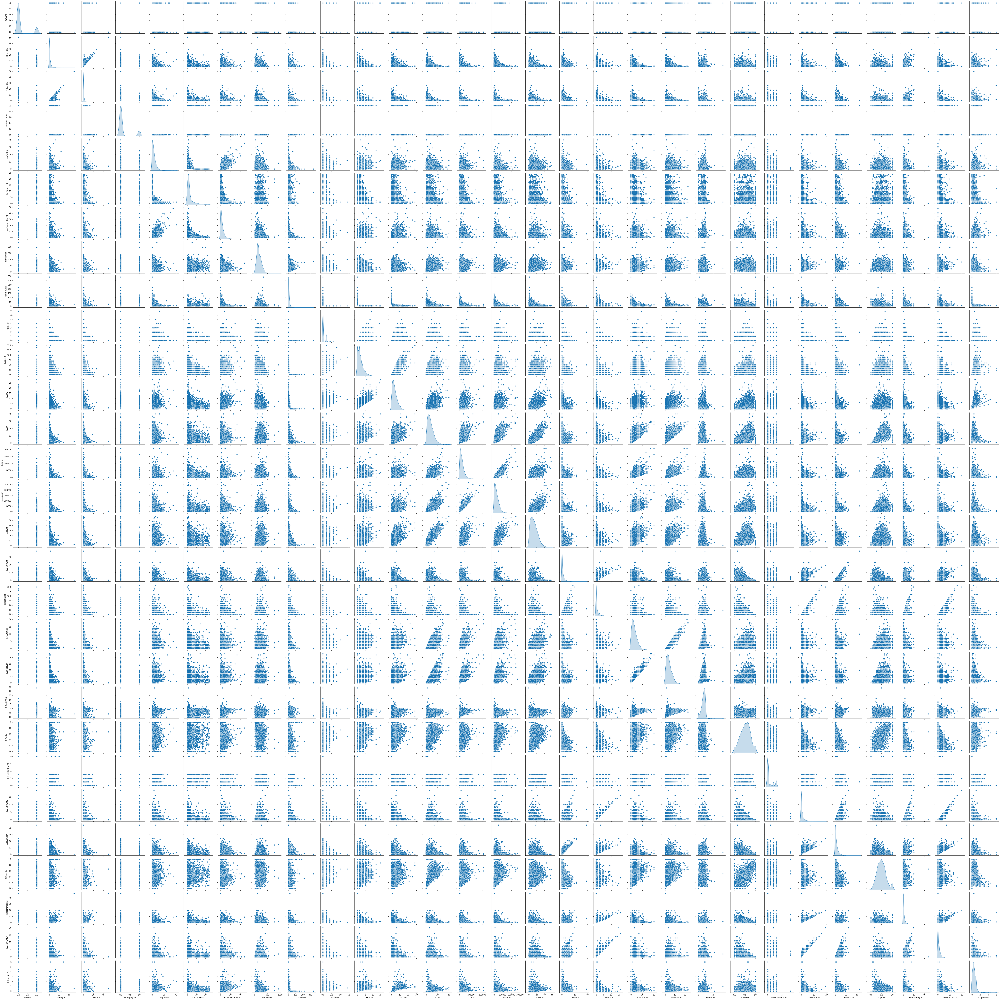

In [22]:
plt.figure(figsize=(25, 15))
sns.pairplot(nums_plot, diag_kind='kde', height=2.5);

## Pairplot with Hue

Sekarang coba kita manfaatkan Churn sebagai hue untuk melihat apakah ada perbedaan behaviour dari value yang Churn dan tidak Churn pada tiap pasangan feature. Dalam hal ini, kita mengharapkan value 0 dan 1 pada Churn terpisah dengan baik pada suatu pasangan feature.

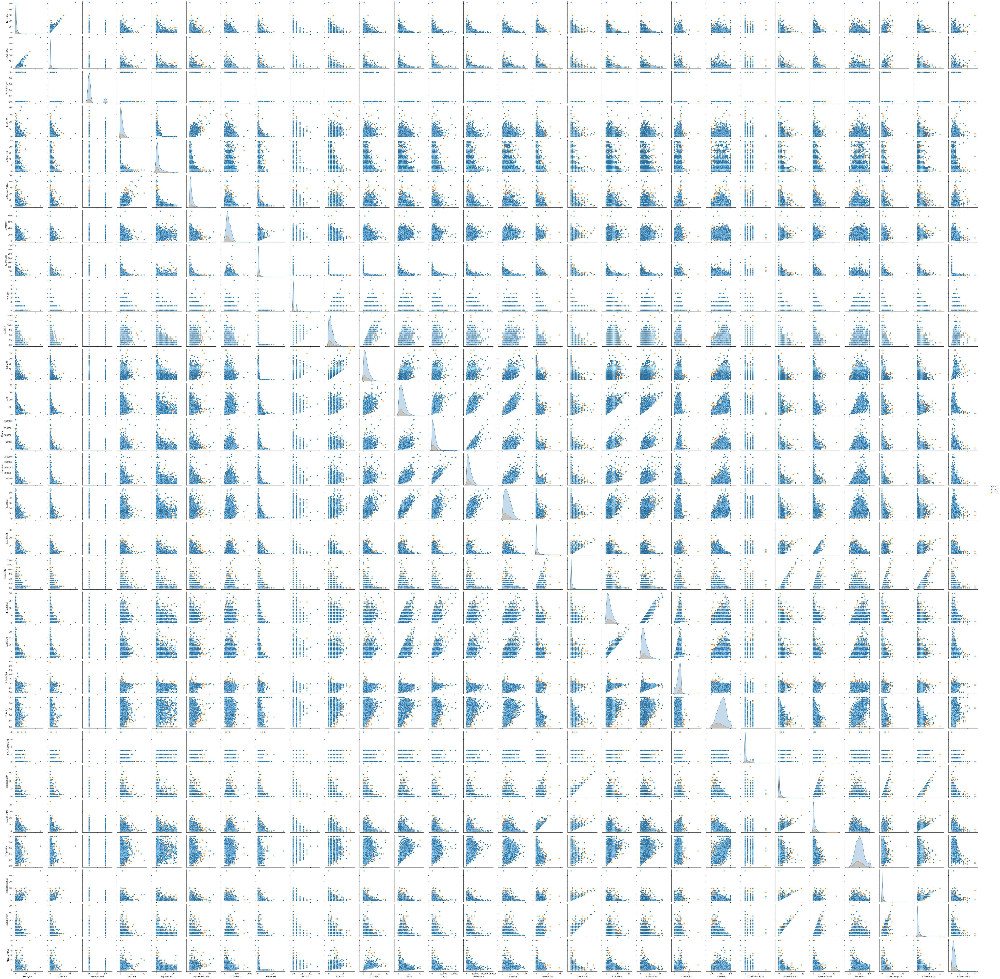

In [23]:
sns.pairplot(nums_plot, diag_kind='kde', height=2.5, hue='TARGET');

# Business Insight

## Finance Inquires 24 Months

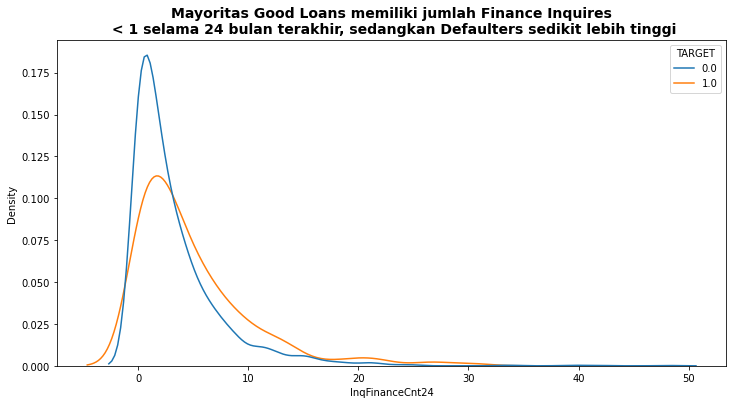

In [43]:
plt.figure(figsize=(12, 6))
plt.title('Mayoritas Good Loans memiliki jumlah Finance Inquires\n < 1 selama 24 bulan terakhir, sedangkan Defaulters sedikit lebih tinggi',
         fontsize=14, fontweight='bold')
sns.kdeplot(x='InqFinanceCnt24', data=df, hue='TARGET', common_norm=False);

## Number Trade Lines 60 Days or Worse Ever

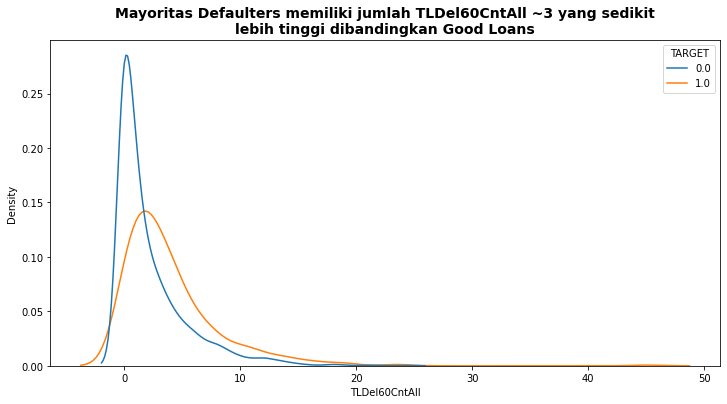

In [36]:
plt.figure(figsize=(12, 6))
plt.title('Mayoritas Defaulters memiliki jumlah TLDel60CntAll ~3 yang sedikit\nlebih tinggi dibandingkan Good Loans',
         fontsize=14, fontweight='bold')
sns.kdeplot(x='TLDel60CntAll', data=df, hue='TARGET', common_norm=False);

## Number Trade Lines 30 or 60 Days 24 Months

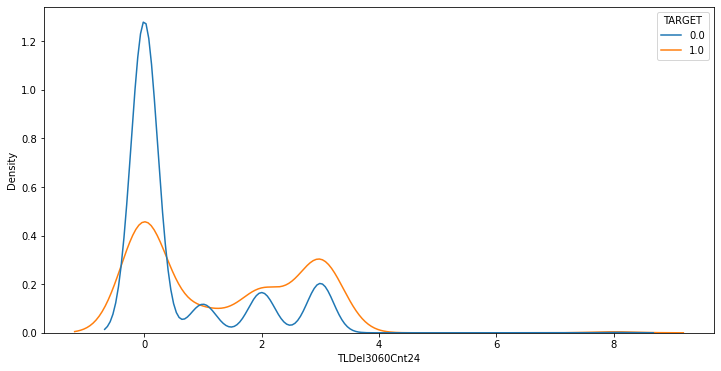

In [28]:
plt.figure(figsize=(12, 6))
sns.kdeplot(x='TLDel3060Cnt24', data=df, hue='TARGET', common_norm=False);

## Number Trade Lines 75 pct Utilized

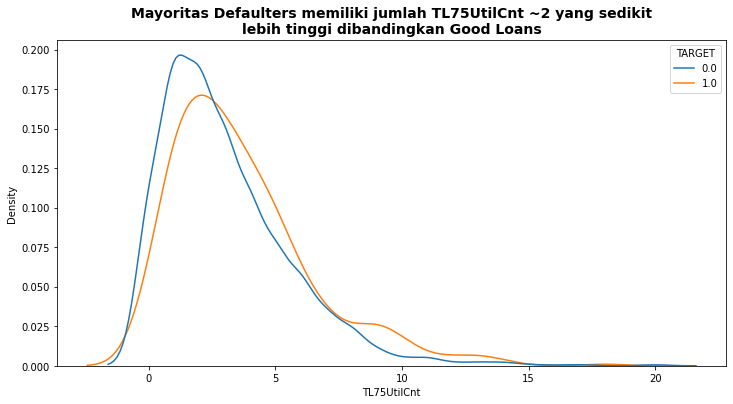

In [48]:
plt.figure(figsize=(12, 6))
plt.title('Mayoritas Defaulters memiliki jumlah TL75UtilCnt ~2 yang sedikit\nlebih tinggi dibandingkan Good Loans',
         fontsize=14, fontweight='bold')
sns.kdeplot(x='TL75UtilCnt', data=df, hue='TARGET', common_norm=False);

## Inquiries 6 Months

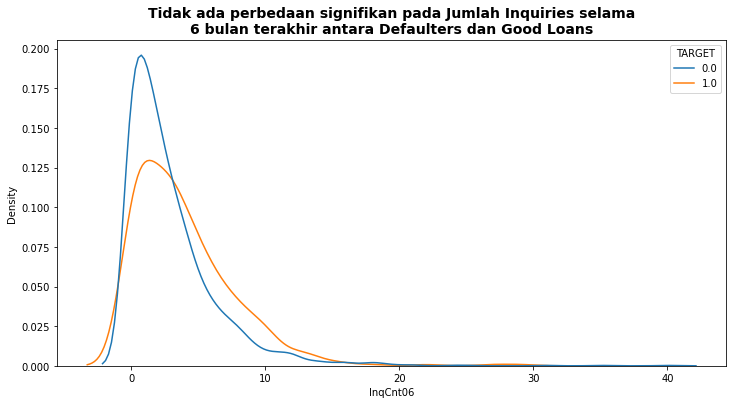

In [51]:
plt.figure(figsize=(12, 6))
plt.title('Tidak ada perbedaan signifikan pada Jumlah Inquiries selama\n6 bulan terakhir antara Defaulters dan Good Loans',
         fontsize=14, fontweight='bold')
sns.kdeplot(x='InqCnt06', data=df, hue='TARGET', common_norm=False);

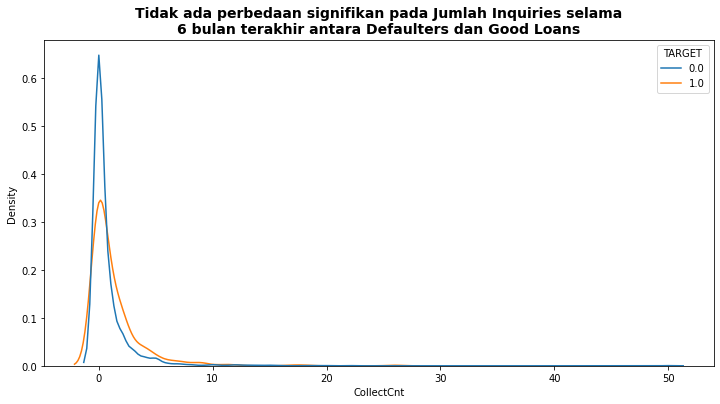

In [52]:
plt.figure(figsize=(12, 6))
plt.title('Tidak ada perbedaan signifikan pada Jumlah Inquiries selama\n6 bulan terakhir antara Defaulters dan Good Loans',
         fontsize=14, fontweight='bold')
sns.kdeplot(x='CollectCnt', data=df, hue='TARGET', common_norm=False);

## Collections

In [67]:
collection = df.groupby('TARGET').agg({'CollectCnt':'mean'}).reset_index()
collection['CollectCnt'] = round(collection['CollectCnt'], 2)
collection

,TARGET,CollectCnt
0,0.0,0.77
1,1.0,1.31


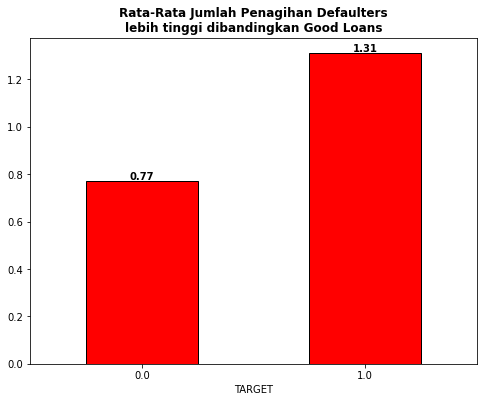

In [73]:
ax = collection.plot(x='TARGET', y='CollectCnt', kind='bar', figsize=(8, 6), legend=False, rot=0,
               color='red', edgecolor='black')

for label in ax.containers:
    ax.bar_label(label, fontweight='bold')
    
plt.title('Rata-Rata Jumlah Penagihan Defaulters\nlebih tinggi dibandingkan Good Loans',
         fontsize=12, fontweight='bold');